<a href="https://colab.research.google.com/github/ReshmaShinde123/ReshmaShinde123/blob/main/NLP_Project_Movie_Review_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Embedding,SimpleRNN,Bidirectional,LSTM


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
df=pd.read_csv('/content/IMDB Dataset.csv',encoding='ISO-8859-1')

In [ ]:
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


In [ ]:
#Check one review in full
df["review"][3]

"Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenly, Jake decides to become Rambo and kill the zombie.<br /><br />OK, first of all when you're going to make a film you must Decide if its a thriller or a drama! As a drama the movie is watchable. Parents are divorcing & arguing like in real life. And then we have Jake with his closet which totally ruins all the film! I expected to see a BOOGEYMAN similar movie, and instead i watched a drama with some meaningless thriller spots.<br /><br />3 out of 10 just for the well playing parents & descent dialogs. As for the shots with Jake: just ignore them."

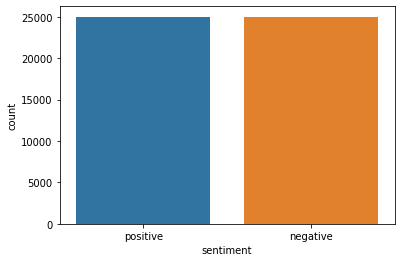

In [ ]:
import seaborn as sns
sns.countplot(x='sentiment', data=df)

In [ ]:
#Both +ve and -ve are balanced

#WorldCloud to highlight main words

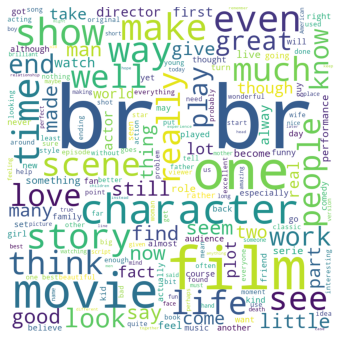

In [ ]:
wc=WordCloud(width=800,                 #for positive ratings
             height=800,
             background_color="white",
             min_font_size=10)
wc.generate(''.join(df[df["sentiment"]=='positive']["review"]))
plt.figure(figsize=(6,6))
plt.imshow(wc)
plt.axis("off")
plt.show()

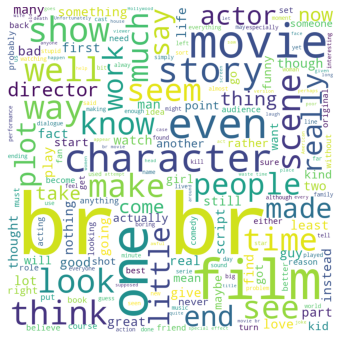

In [ ]:
wc=WordCloud(width=800,              #for negative ratings
             height=800,
             background_color="white",
             min_font_size=10)
wc.generate(''.join(df[df["sentiment"]=='negative']["review"]))
plt.figure(figsize=(6,6))
plt.imshow(wc)
plt.axis("off")
plt.show()

In [ ]:
#Divide our dataset into train and test sets. The train set will be used to train our deep learning models 
#while the test set will be used to evaluate how well our model performs.

In [ ]:
x=df["review"]
y=df["sentiment"]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=1)

Preparing the Embedding Layer

In [ ]:
tok=Tokenizer()
tok.fit_on_texts(x_train)

In [ ]:
tok.index_word

{1: 'the',
 2: 'and',
 3: 'a',
 4: 'of',
 5: 'to',
 6: 'is',
 7: 'br',
 8: 'in',
 9: 'it',
 10: 'i',
 11: 'this',
 12: 'that',
 13: 'was',
 14: 'as',
 15: 'for',
 16: 'with',
 17: 'movie',
 18: 'but',
 19: 'film',
 20: 'on',
 21: 'not',
 22: 'you',
 23: 'are',
 24: 'his',
 25: 'have',
 26: 'be',
 27: 'one',
 28: 'he',
 29: 'all',
 30: 'at',
 31: 'by',
 32: 'an',
 33: 'they',
 34: 'so',
 35: 'from',
 36: 'who',
 37: 'like',
 38: 'or',
 39: 'just',
 40: 'about',
 41: 'her',
 42: 'out',
 43: 'if',
 44: "it's",
 45: 'has',
 46: 'there',
 47: 'some',
 48: 'what',
 49: 'good',
 50: 'more',
 51: 'very',
 52: 'when',
 53: 'up',
 54: 'no',
 55: 'my',
 56: 'even',
 57: 'time',
 58: 'would',
 59: 'she',
 60: 'which',
 61: 'only',
 62: 'really',
 63: 'see',
 64: 'story',
 65: 'their',
 66: 'had',
 67: 'can',
 68: 'me',
 69: 'well',
 70: 'were',
 71: 'than',
 72: 'much',
 73: 'we',
 74: 'get',
 75: 'been',
 76: 'great',
 77: 'bad',
 78: 'will',
 79: 'other',
 80: 'also',
 81: 'do',
 82: 'into',
 83

In [ ]:
vocab_len=len(tok.index_word)
vocab_len

106188

In [ ]:
#text to squence
train_sequence=tok.texts_to_sequences(x_train)
train_sequence

[[39,
  3,
  880,
  5,
  720,
  5,
  1,
  726,
  920,
  1148,
  4,
  3,
  314,
  2507,
  149,
  25,
  1,
  1782,
  870,
  1438,
  45,
  75,
  3158,
  123,
  31,
  1,
  1124,
  196,
  8,
  24503,
  761,
  1476,
  14,
  1,
  105,
  104,
  23,
  34,
  733,
  18,
  314,
  2507,
  6,
  5774,
  1,
  1707,
  4,
  1,
  105,
  1087],
 [27,
  4,
  1,
  251,
  104,
  10,
  25,
  108,
  5,
  1320,
  1147,
  204,
  128,
  2,
  62,
  77,
  111,
  80,
  81,
  21,
  344,
  1,
  61,
  49,
  223,
  6,
  1925,
  27816,
  513,
  18,
  11,
  124,
  21,
  5064,
  1,
  19,
  51,
  72,
  9,
  477,
  53,
  5,
  91,
  488,
  19,
  10085,
  2,
  4124,
  1,
  2234,
  16,
  1652,
  5775,
  3,
  449,
  4,
  55,
  285,
  257,
  10,
  252,
  428,
  5,
  884,
  16,
  91,
  215,
  643,
  98,
  3,
  169,
  3656,
  10,
  81,
  21,
  370,
  11,
  19,
  901,
  22,
  103,
  9,
  15,
  867,
  38,
  91,
  3,
  3614,
  3,
  3614,
  22,
  67,
  994,
  15,
  1,
  32691,
  2,
  2340,
  140,
  15,
  3,
  608,
  12088,
  7,
  7,
  

In [ ]:
#document_len

doc_len=[]
for doc in train_sequence:
	doc_len.append(len(doc))


In [ ]:
doc_len

[50,
 111,
 590,
 257,
 124,
 367,
 125,
 215,
 371,
 197,
 98,
 147,
 909,
 92,
 80,
 251,
 1006,
 140,
 221,
 58,
 131,
 155,
 174,
 124,
 122,
 39,
 220,
 318,
 181,
 143,
 127,
 79,
 116,
 274,
 193,
 170,
 798,
 137,
 128,
 194,
 115,
 149,
 395,
 90,
 343,
 138,
 361,
 63,
 158,
 169,
 202,
 151,
 165,
 353,
 141,
 194,
 122,
 222,
 35,
 316,
 197,
 403,
 324,
 241,
 126,
 166,
 338,
 142,
 274,
 722,
 100,
 257,
 173,
 100,
 634,
 85,
 161,
 205,
 120,
 434,
 72,
 269,
 158,
 367,
 364,
 91,
 553,
 135,
 542,
 207,
 182,
 277,
 161,
 290,
 341,
 132,
 107,
 640,
 227,
 278,
 345,
 95,
 549,
 99,
 233,
 149,
 621,
 987,
 95,
 189,
 357,
 456,
 107,
 377,
 215,
 118,
 115,
 55,
 145,
 577,
 76,
 186,
 432,
 141,
 142,
 265,
 85,
 790,
 188,
 433,
 147,
 49,
 246,
 298,
 366,
 312,
 138,
 126,
 195,
 187,
 201,
 252,
 147,
 121,
 414,
 782,
 157,
 143,
 148,
 68,
 428,
 117,
 144,
 62,
 130,
 182,
 257,
 566,
 208,
 195,
 106,
 314,
 130,
 130,
 255,
 90,
 227,
 584,
 167,
 446,
 1

In [ ]:
max(doc_len)

2493

In [ ]:
np.quantile(doc_len,0.99)

923.0

In [ ]:
max_len=520


In [ ]:
#paddding
train_matrix=sequence.pad_sequences(train_sequence,maxlen=max_len)
train_matrix

array([[   0,    0,    0, ...,    1,  105, 1087],
       [   0,    0,    0, ...,    7,  302,  155],
       [   7,    7,    8, ...,    2,  217,  804],
       ...,
       [   0,    0,    0, ..., 3878,  456,  155],
       [   0,    0,    0, ...,   10,  214,   11],
       [   0,    0,    0, ...,   69,  546, 1155]], dtype=int32)

In [ ]:
 #test data processing
test_sequences=tok.texts_to_sequences(x_test)
test_sequences

[[16,
  54,
  342,
  1719,
  22,
  74,
  357,
  414,
  37,
  12,
  14,
  11,
  9122,
  4420,
  204,
  489,
  754,
  5,
  26,
  108,
  5,
  26,
  2361,
  993,
  6545,
  6,
  2076,
  31,
  24,
  1989,
  1486,
  298,
  32,
  46684,
  8,
  2391,
  18,
  215,
  312,
  1830,
  31,
  1,
  2311,
  713,
  957,
  730,
  153,
  2,
  1486,
  6,
  146,
  3,
  11257,
  1598,
  12099,
  16,
  3,
  323,
  1145,
  32185,
  20213,
  8,
  24,
  1138,
  24,
  167,
  1598,
  1707,
  6,
  8220,
  254,
  5,
  1,
  8138,
  12184,
  31,
  1993,
  5015,
  36,
  237,
  10,
  720,
  21,
  61,
  149,
  593,
  282,
  5,
  1092,
  16,
  3,
  1598,
  1186,
  18,
  3636,
  50,
  3,
  2751,
  1641,
  8216,
  8,
  10600,
  16,
  24,
  14117,
  2717,
  48,
  6,
  56,
  50,
  1853,
  6,
  1,
  188,
  12,
  28,
  13,
  80,
  1,
  724,
  3118,
  15,
  11,
  19,
  529,
  993,
  6,
  845,
  12291,
  31,
  1,
  3697,
  5,
  2448,
  1486,
  176,
  28,
  5844,
  53,
  16,
  2064,
  3,
  2178,
  3717,
  36,
  45,
  26584,
  28354

In [ ]:
test_matrix=sequence.pad_sequences(test_sequences,maxlen=max_len)

Text Classification with Simple Neural Network

In [ ]:
model=Sequential()
model.add(Embedding(vocab_len+1,70,input_length=max_len,mask_zero=True))
model.add(Bidirectional(SimpleRNN(64)))  # activation: Any
model.add(Dense(64,activation="relu")) 
model.add(Dense(64,activation="relu"))
model.add(Dense(1,activation="sigmoid"))


In [ ]:
model.compile(optimizer="adam",loss="binary_crossentropy")

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y_train=le.fit_transform(y_train)
y_test=le.transform(y_test)

In [ ]:
model.fit(train_matrix,y_train,epochs=5,batch_size=32)

Epoch 1/5
1094/1094 [==============================] - 556s 506ms/step - loss: 0.6657
Epoch 2/5
1094/1094 [==============================] - 556s 508ms/step - loss: 0.4504
Epoch 3/5
1094/1094 [==============================] - 556s 509ms/step - loss: 0.4369
Epoch 4/5
1094/1094 [==============================] - 562s 514ms/step - loss: 0.3793
Epoch 5/5
1094/1094 [==============================] - 556s 508ms/step - loss: 0.3746


In [ ]:
y_pred = model.predict(test_matrix)

In [ ]:
y_pred = np.where(y_pred >= 0.5,1,0)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.84      0.73      7521
           1       0.77      0.54      0.63      7479

    accuracy                           0.69     15000
   macro avg       0.71      0.69      0.68     15000
weighted avg       0.71      0.69      0.68     15000



In [ ]:
#In Sequence Modelling we use RNN instead of Flatten layer
#Replace Flatten with SimpleRNN
#Put 64 in SimpleRNN then put SimpleRNN in Bidirectional


#LSTM (long Short Term Memory)
#features Extract karna> Important words collect karna

In [ ]:
#LSTM
model=Sequential()
model.add(Embedding(vocab_len+1,70,input_length=max_len,mask_zero=True))
model.add(LSTM(64))  # activation: Any #first with LSTM and then with Bidirectional LSTM
model.add(Dense(64,activation="relu")) 
model.add(Dense(64,activation="relu"))
model.add(Dense(1,activation="sigmoid"))


In [ ]:
model.compile(optimizer="adam",loss="binary_crossentropy")

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y_train=le.fit_transform(y_train)
y_test=le.transform(y_test)

In [ ]:
model.fit(train_matrix,y_train,epochs=5,batch_size=64)

Epoch 1/5
547/547 [==============================] - 360s 656ms/step - loss: 0.3824
Epoch 2/5
547/547 [==============================] - 354s 647ms/step - loss: 0.1892
Epoch 3/5
547/547 [==============================] - 357s 654ms/step - loss: 0.1012
Epoch 4/5
547/547 [==============================] - 354s 647ms/step - loss: 0.0642
Epoch 5/5
547/547 [==============================] - 353s 645ms/step - loss: 0.0402


In [ ]:
y_pred = model.predict(test_matrix)

In [ ]:
y_pred = np.where(y_pred >= 0.5,1,0)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.87      0.88      7521
           1       0.87      0.88      0.88      7479

    accuracy                           0.88     15000
   macro avg       0.88      0.88      0.88     15000
weighted avg       0.88      0.88      0.88     15000



#GRU

In [ ]:
model=Sequential()
model.add(Embedding(vocab_len+1,70,input_length=max_len,mask_zero=True))
model.add(Bidirectional(SimpleRNN(64)))  # activation: Any
model.add(Dense(64,activation="relu")) 
model.add(Dense(64,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

In [ ]:
model.compile(optimizer="adam",loss="binary_crossentropy")

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y_train=le.fit_transform(y_train)
y_test=le.transform(y_test)

In [ ]:
model.fit(train_matrix,y_train,epochs=5,batch_size=64)

Epoch 1/5
547/547 [==============================] - 360s 653ms/step - loss: 0.6896
Epoch 2/5
547/547 [==============================] - 372s 679ms/step - loss: 0.5046
Epoch 3/5
547/547 [==============================] - 398s 728ms/step - loss: 0.3629
Epoch 4/5
547/547 [==============================] - 396s 724ms/step - loss: 0.2466
Epoch 5/5
547/547 [==============================] - 362s 661ms/step - loss: 0.2049


In [ ]:
y_pred = model.predict(test_matrix)

In [ ]:
y_pred = np.where(y_pred >= 0.5,1,0)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.90      0.82      7521
           1       0.87      0.70      0.78      7479

    accuracy                           0.80     15000
   macro avg       0.81      0.80      0.80     15000
weighted avg       0.81      0.80      0.80     15000

